# Facial Detection Project

## Team Ace of Face

Data from the Kaggle project:

https://www.kaggle.com/karanjakhar/facial-keypoint-detection

In [1]:
# Importing the necessary libraries using custom library file `helper_functions`
from helper_functions import *

%matplotlib inline

**Code is included in the `helper_functions` file but shown here for visual assistance of variable names**
+ Files come as csv format
+ 'training' and 'test' sets formatted to parquet to reduce size of files

```python
# Importing the data sets downloaded from Kaggle

data_dir = 'data_files/'
lookid_data = pd.read_csv(data_dir + 'IdLookupTable.csv')
sample_sub = pd.read_csv(data_dir + 'SampleSubmission.csv')
train_data1 = pd.read_parquet(data_dir + 'train_data_1.gzip')
train_data2 = pd.read_parquet(data_dir + 'train_data_2.gzip')
train_data = pd.concat([train_data1, train_data2])
test_data = pd.read_parquet(data_dir + 'test_data.gzip')

# Clean training data - No missing features, only complete sets
clean_data = train_data.copy().dropna()
```

# Data Exploration of the Kaggle Data Set

## Dataset "training"

In [2]:
# Peaking at the training data
train_data.head()

,left_eye_center_x,left_eye_center_y,right_eye_center_x,right_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,right_eye_inner_corner_x,right_eye_inner_corner_y,...,nose_tip_y,mouth_left_corner_x,mouth_left_corner_y,mouth_right_corner_x,mouth_right_corner_y,mouth_center_top_lip_x,mouth_center_top_lip_y,mouth_center_bottom_lip_x,mouth_center_bottom_lip_y,Image
0,66.033564,39.002274,30.227008,36.421678,59.582075,39.647423,73.130346,39.969997,36.356571,37.389402,...,57.066803,61.195308,79.970165,28.614496,77.388992,43.312602,72.935459,43.130707,84.485774,238 236 237 238 240 240 239 241 241 243 240 23...
1,64.332936,34.970077,29.949277,33.448715,58.856170,35.274349,70.722723,36.187166,36.034723,34.361532,...,55.660936,56.421447,76.352000,35.122383,76.047660,46.684596,70.266553,45.467915,85.480170,219 215 204 196 204 211 212 200 180 168 178 19...
2,65.057053,34.909642,30.903789,34.909642,59.412000,36.320968,70.984421,36.320968,37.678105,36.320968,...,53.538947,60.822947,73.014316,33.726316,72.732000,47.274947,70.191789,47.274947,78.659368,144 142 159 180 188 188 184 180 167 132 84 59 ...
3,65.225739,37.261774,32.023096,37.261774,60.003339,39.127179,72.314713,38.380967,37.618643,38.754115,...,54.166539,65.598887,72.703722,37.245496,74.195478,50.303165,70.091687,51.561183,78.268383,193 192 193 194 194 194 193 192 168 111 50 12 ...
4,66.725301,39.621261,32.244810,38.042032,58.565890,39.621261,72.515926,39.884466,36.982380,39.094852,...,64.889521,60.671411,77.523239,31.191755,76.997301,44.962748,73.707387,44.227141,86.871166,147 148 160 196 215 214 216 217 219 220 206 18...


In [21]:
# Checking the size of the data set and the columns it contains
print("Shape of train_data:", train_data.shape)
print()
print("Column names:")
print(train_data.columns)
print()
print("Contains missing data points:", train_data.isnull().values.any())
print()
print("Missing data points number by feature:")
print(train_data.isnull().sum())

Shape of train_data: (7049, 31)

Column names:
Index(['left_eye_center_x', 'left_eye_center_y', 'right_eye_center_x',
       'right_eye_center_y', 'left_eye_inner_corner_x',
       'left_eye_inner_corner_y', 'left_eye_outer_corner_x',
       'left_eye_outer_corner_y', 'right_eye_inner_corner_x',
       'right_eye_inner_corner_y', 'right_eye_outer_corner_x',
       'right_eye_outer_corner_y', 'left_eyebrow_inner_end_x',
       'left_eyebrow_inner_end_y', 'left_eyebrow_outer_end_x',
       'left_eyebrow_outer_end_y', 'right_eyebrow_inner_end_x',
       'right_eyebrow_inner_end_y', 'right_eyebrow_outer_end_x',
       'right_eyebrow_outer_end_y', 'nose_tip_x', 'nose_tip_y',
       'mouth_left_corner_x', 'mouth_left_corner_y', 'mouth_right_corner_x',
       'mouth_right_corner_y', 'mouth_center_top_lip_x',
       'mouth_center_top_lip_y', 'mouth_center_bottom_lip_x',
       'mouth_center_bottom_lip_y', 'Image'],
      dtype='object')

Contains missing data points: True

Missing data points 

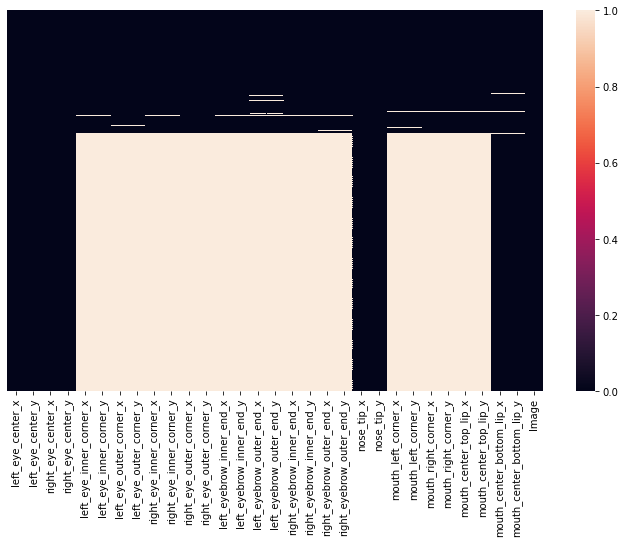

In [4]:
# Create heatmap to show data coverage by feature
# Black columns have little or no missing data
plt.figure(figsize=(12, 7))
sns.heatmap(train_data.isnull(), yticklabels=False)
plt.show()

In [5]:
# Checking the type of a random point on the table outside of `Image`
rand_point = train_data.iloc[52, 4]
print(type(rand_point))

<class 'numpy.float64'>


In [6]:
# Exploring the contents of the `Image` column
img_test = train_data.iloc[0, 30]
print(type(img_test))
print()
# Splitting the string into a list for each number
img_test = img_test.split(" ")
# Data is in string format so changed to int
img_test = list(map(int, img_test))
# Data is a 1-D array of 9216 pixels
img_np = np.array(img_test).reshape(96, 96)
print(img_np)

<class 'str'>

[[238 236 237 ... 250 250 250]
 [235 238 236 ... 249 250 251]
 [237 236 237 ... 251 251 250]
 ...
 [186 183 181 ...  52  57  60]
 [189 188 207 ...  61  69  78]
 [191 184 184 ...  70  75  90]]


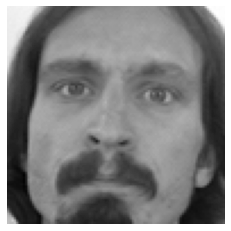

In [7]:
# Checking what selected image displays
plt.imshow(img_np, cmap="gray", aspect='equal')
plt.xticks = []
plt.yticks = []
plt.axis('off')
plt.show()

### Dataset 'training' conclusion
This dataset contains all of the training examples needed to beginning training the machine learning model. It is split by labels of either the x or y coordinate of a specific face part. It also contains a column that has the image that corresponds with the coordinates in the other columns. Each row is a new image with its respective coordinates.

The coordinates values are floats and represent the pixel location on the included image in either the x or y orientation. The image is included in the dataset as a string of all of the pixel values. After converting the string into a list and then array of ints, each image contains an array of 9216 pixels. This comes out to be a image of 96 by 96 pixels.

**Dataset contains 7049 rows and 30 features/labels or 15 pairs of coordinates.**

**Not all of the images have coordinates for all of the possible labels in the dataset.**

## Dataset "IdLookupTable"

In [8]:
# Peaking at IdLookupTable
lookid_data.head()

,RowId,ImageId,FeatureName,Location
0,1,1,left_eye_center_x,NaN
1,2,1,left_eye_center_y,NaN
2,3,1,right_eye_center_x,NaN
3,4,1,right_eye_center_y,NaN
4,5,1,left_eye_inner_corner_x,NaN


In [20]:
# Exploring content of lookTable
print("Shape of lookid_data:", lookid_data.shape)
print("")
print("Number of each variable in 'FeatureName':")
print(lookid_data["FeatureName"].value_counts())
print("")
print('Number of Image IDs in lookid_data:', lookid_data['ImageId'].nunique())
print("")
print("Amout of null values per column:")
print(lookid_data.isnull().sum())

Shape of lookid_data: (27124, 4)

Number of each variable in 'FeatureName':
nose_tip_y                   1783
nose_tip_x                   1783
right_eye_center_x           1782
left_eye_center_x            1782
left_eye_center_y            1782
right_eye_center_y           1782
mouth_center_bottom_lip_x    1778
mouth_center_bottom_lip_y    1778
mouth_center_top_lip_x        590
mouth_left_corner_y           590
mouth_left_corner_x           590
mouth_center_top_lip_y        590
left_eye_outer_corner_y       589
left_eye_outer_corner_x       589
right_eye_inner_corner_x      589
right_eye_inner_corner_y      589
left_eye_inner_corner_y       588
right_eye_outer_corner_x      588
left_eye_inner_corner_x       588
right_eye_outer_corner_y      588
mouth_right_corner_y          587
mouth_right_corner_x          587
left_eyebrow_inner_end_x      585
right_eyebrow_inner_end_x     585
right_eyebrow_inner_end_y     585
left_eyebrow_inner_end_y      585
left_eyebrow_outer_end_x      574
left_e

### Dataset 'IdLookTable' conclusion
This dataset contains information on features/labels for the facial parts that each image contains. Every image does not have the equal amount of labels. Some are missing label points so therefore the images may not be complete faces. The column 'Location' has no information, as in all the rows contain NaN values.

**Uncertain which images the 'ImageId' refer to. Can possiblity be the row in the training set.**

## Dataset "SampleSubmission"

In [11]:
# Peaking at SampleSubmission
sample_sub.head()

,RowId,Location
0,1,0
1,2,0
2,3,0
3,4,0
4,5,0


In [19]:
print("Shape of sample_data:", sample_sub.shape)  # Same numbers of rows as Lookid_data
print()
print("Number of null values per column:")
print(sample_sub.isnull().sum())   # Checking for blank points
print()
print("Unique values in 'Location':")
print(sample_sub['Location'].value_counts())

Shape of sample_data: (27124, 2)

Number of null values per column:
RowId       0
Location    0
dtype: int64

Unique values in 'Location':
0    27124
Name: Location, dtype: int64


### Dataset 'SampleSubmission' conclusion
This dataset doesn't seem to provide any information. The 'Location' column only consists of the value 0. 

## Dataset "test"

In [16]:
# Peaking at test data
test_data.head()

,ImageId,Image
0,1,182 183 182 182 180 180 176 169 156 137 124 10...
1,2,76 87 81 72 65 59 64 76 69 42 31 38 49 58 58 4...
2,3,177 176 174 170 169 169 168 166 166 166 161 14...
3,4,176 174 174 175 174 174 176 176 175 171 165 15...
4,5,50 47 44 101 144 149 120 58 48 42 35 35 37 39 ...


In [18]:
print("Shape of test_data:", test_data.shape)
print("")
print("Contains any null values:", test_data.isnull().values.any())

Shape of test_data: (1783, 2)

Contains any null values: False


In [23]:
# Exploring the content of the image column in test data
test_img = test_data['Image'][10]
print("Data type of point in 'Image:'", type(test_img))
print("")
# Spliting the string into a list for each number
test_img = test_img.split(" ")
# Data is in string format so changed to int
test_img = list(map(int, test_img))
test_img_np = np.array(test_img).reshape(96, 96)  # Data is a 1-D array of 9216 pixels
print(test_img_np)

Data type of point in 'Image:' <class 'str'>

[[182 182 182 ... 181 182 182]
 [183 182 182 ... 183 182 182]
 [180 181 181 ... 182 181 181]
 ...
 [170 126  77 ... 173 173 172]
 [ 58   4   0 ... 175 173 173]
 [  0   0   3 ...  40  81 141]]


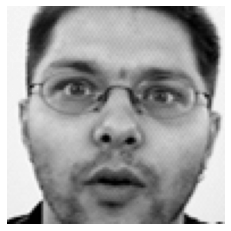

In [24]:
# Checking what selected image displays
plt.imshow(test_img_np, cmap="gray", aspect='equal')
plt.xticks = []
plt.yticks = []
plt.axis('off')
plt.show()

### Dataset "test" conclusion
This set contains a column of string based 1-D pixel arrays. Once converted into int values and shaped into a 96 by 96 image, they display faces for testing the model.

**Dataset contains 1783 images.**

# Exploring images with missing data points

To deal the missing data, we are first going to seperate the data into different groups. One containing only complete data points,  one containing 5 or less points missing, one containing 15 or less points, and other greater than 15 points missing.

+ Using code provided by the Medium article: https://medium.com/diving-in-deep/facial-keypoints-detection-with-pytorch-86bac79141e4
+ Using functions `show_keypoints` and `show_images` from article


**Code already loaded in `helper_functions`**

We will begin to the seperate the groups, by counting the amount of NaN each row contains

In [25]:
# Counting the amount of NA in each row and add results as a new column
train_data['Num_NaN'] = train_data.isnull().sum(axis=1)
train_data.tail()

,left_eye_center_x,left_eye_center_y,right_eye_center_x,right_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,right_eye_inner_corner_x,right_eye_inner_corner_y,...,mouth_left_corner_x,mouth_left_corner_y,mouth_right_corner_x,mouth_right_corner_y,mouth_center_top_lip_x,mouth_center_top_lip_y,mouth_center_bottom_lip_x,mouth_center_bottom_lip_y,Image,Num_NaN
7044,67.402546,31.842551,29.746749,38.632942,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,50.426637,79.683921,71 74 85 105 116 128 139 150 170 187 201 209 2...,22
7045,66.134400,38.365501,30.478626,39.950198,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,50.287397,77.983023,60 60 62 57 55 51 49 48 50 53 56 56 106 89 77 ...,22
7046,66.690732,36.845221,31.666420,39.685042,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,49.462572,78.117120,74 74 74 78 79 79 79 81 77 78 80 73 72 81 77 1...,22
7047,70.965082,39.853666,30.543285,40.772339,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,50.065186,79.586447,254 254 254 254 254 238 193 145 121 118 119 10...,22
7048,66.938311,43.424510,31.096059,39.528604,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,45.900480,82.773096,53 62 67 76 86 91 97 105 105 106 107 108 112 1...,22


In [28]:
# Checking the unique values of NaN counts
train_data["Num_NaN"].value_counts()

22    4755
0     2140
2       87
4       28
24      10
6        9
8        8
12       5
10       3
14       2
20       2
Name: Num_NaN, dtype: int64

## Complete set

In [31]:
# Dataframe of only completed values, no NaN
training_complete = train_data[train_data["Num_NaN"] == 0]
training_complete.isnull().values.any()
training_complete = training_complete.drop("Num_NaN", axis=1)

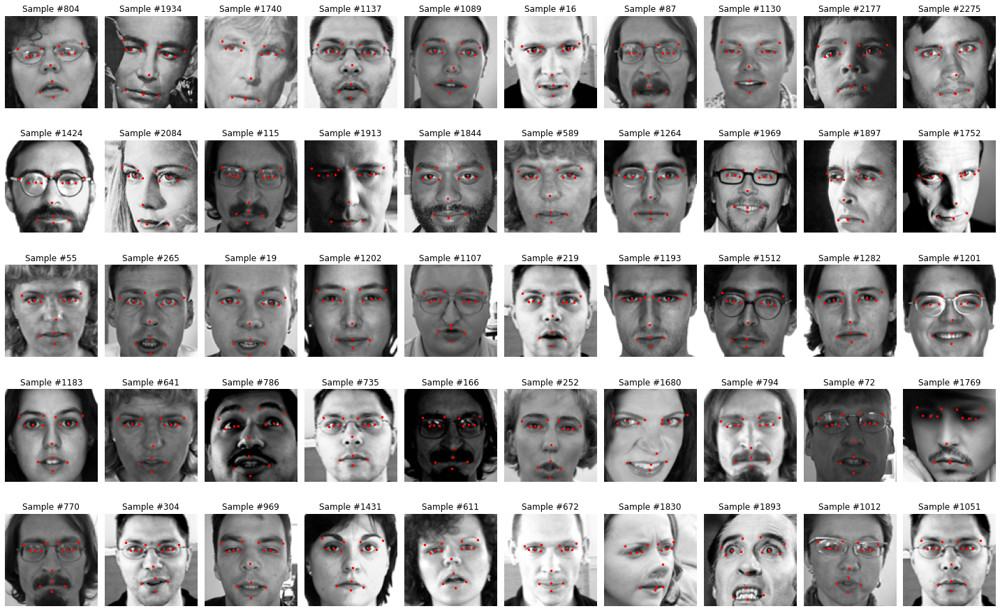

In [32]:
# Displaying images with no NaN, complete labels
# Pictures are randomized
rand_img = np.random.choice(training_complete.index, 50, replace=False)
show_images(training_complete, rand_img, ncols=10, figsize=(20, 15))

### Comments on complete labels set
+ Pictures are clear
+ Subjects faces are mostly facing the camera
+ All tracked points are visible in the image
+ Points are accurate

    **Contains 2140 images**

## 5 or less missing

In [36]:
# Selecting data with 5 or less NaN values, except 0
training_5 = train_data[(train_data["Num_NaN"] != 0) &
                        (train_data["Num_NaN"] < 6)]
training_5["Num_NaN"].value_counts()

2    87
4    28
Name: Num_NaN, dtype: int64

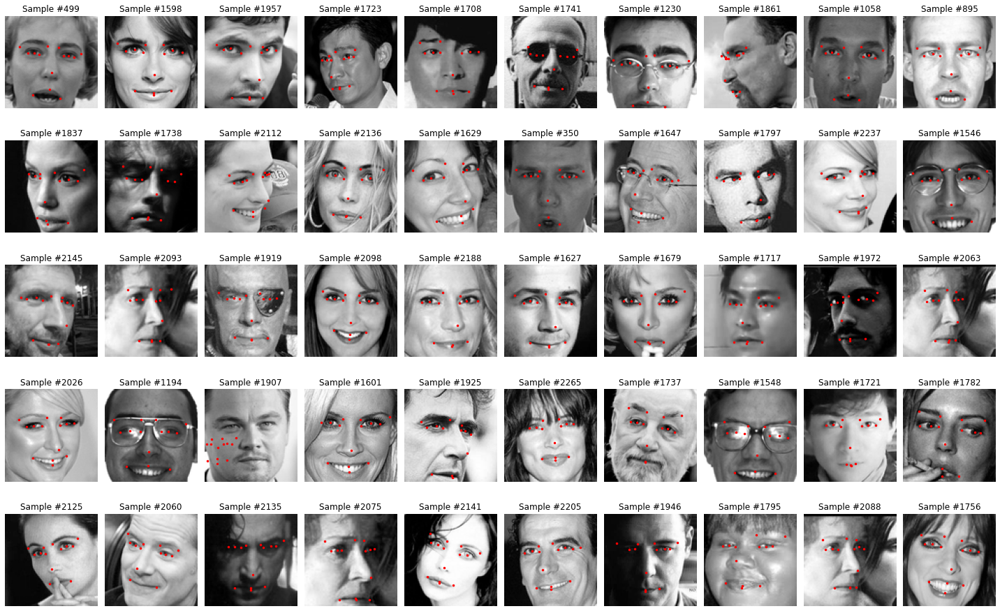

In [37]:
training_5 = training_5.drop("Num_NaN", axis=1)
rand_img = np.random.choice(training_5.index, 50, replace=False)
show_images(training_5, rand_img, ncols=10, figsize=(20, 15))

### Comments on 5 or less NaN set
+ Images similar to complete label set
+ Sample #1907 label points seems to complete miss the image
+ Some tracking points are not clearly visible
+ Some image faces are rotated to the side

    **Contains 115 images**

## Greater than 5 less than 10 missing

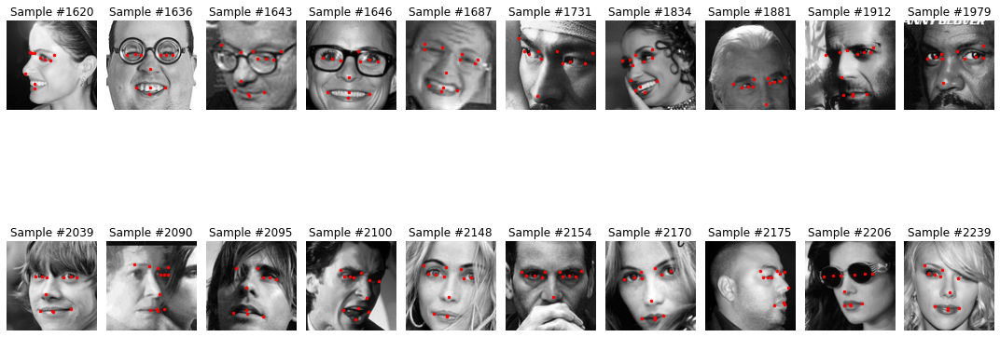

In [51]:
# Data with more than 5 and less than 10 NaN
training_10 = train_data[(train_data["Num_NaN"] > 5)
                         & (train_data["Num_NaN"] < 11)]
training_10 = training_10.drop("Num_NaN", axis=1)
show_images(training_10, training_10.index, ncols=10)

### Comments on 10 or less NaN set
+ Some images are cut so the complete face is not shown
+ Images are faces rotated so they are not completely facing the camera
+ Some tracking points are covered and can not be seen

    **Contains 20 images**

## More than 10 less than 15 missing

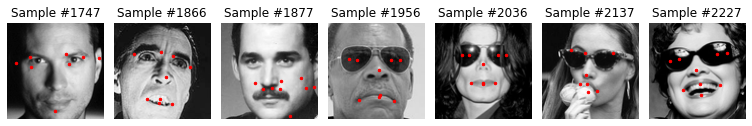

In [47]:
# Data with more than 10 and less than 15 NaN
training_15 = train_data[(train_data["Num_NaN"] > 10)
                         & (train_data["Num_NaN"] < 16)]
training_15 = training_15.drop("Num_NaN", axis=1)
show_images(training_15, training_15.index, ncols=10)

### Comments on 15 or less NaN set
+ Subjects are wearing sunglasses

    **Contains 7 images**

## More than 15 excluding 22 missing

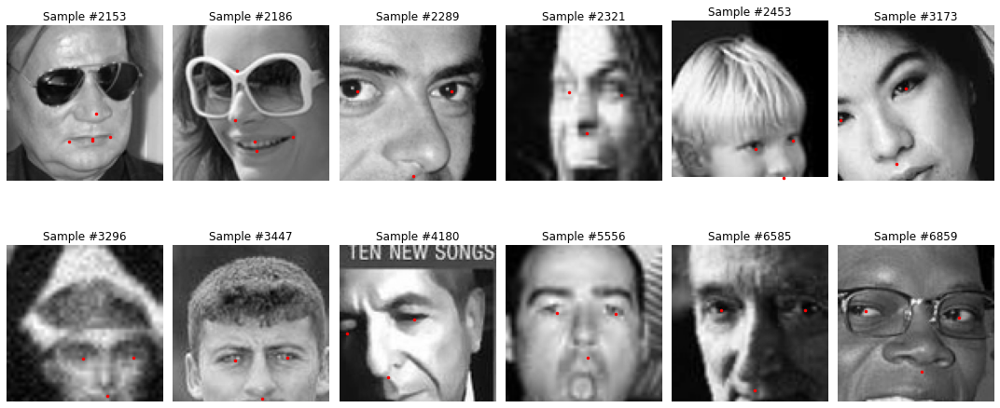

In [50]:
# Data with more than 15 NaN excluding 22 NaN value due to that one having the most examples
training_most_nan = train_data[(train_data["Num_NaN"] > 15) & (
    train_data["Num_NaN"] != 22)]
training_most_nan = training_most_nan.drop("Num_NaN", axis=1)
show_images(training_most_nan, training_most_nan.index, ncols=6)

### Comments on Most NaN set
+ Images are cropped so the complete faces are not shown
+ Some images are of low quality so it is hard to distinguish features

    **Contains 12 images**

## 22 missing

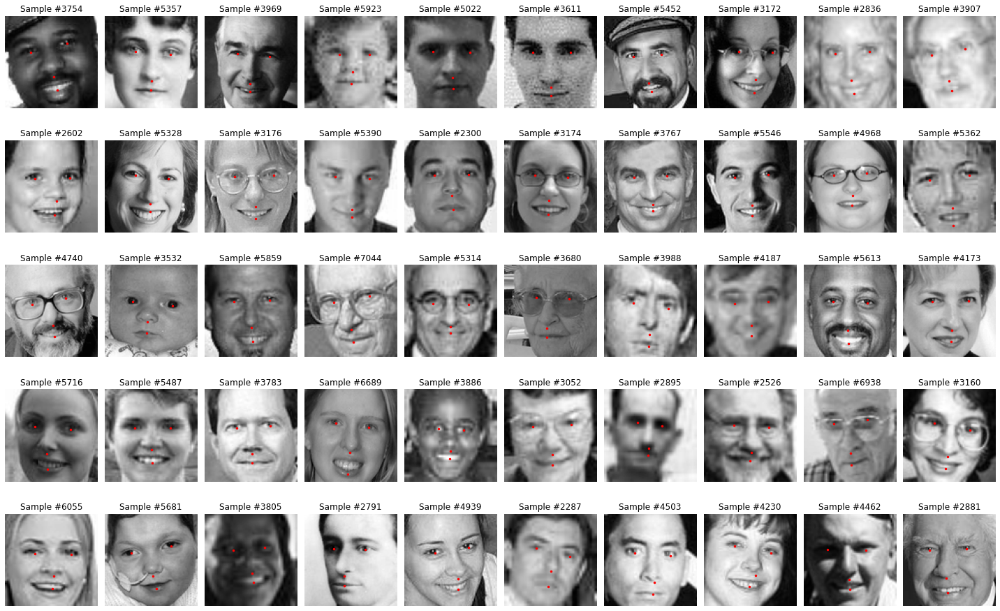

In [52]:
# Data with 22 NaN, contains the most examples
training_22 = train_data[train_data["Num_NaN"] == 22]
training_22 = training_22.drop("Num_NaN", axis=1)
rand_img = np.random.choice(training_22.index, 50, replace=False)
show_images(training_22, rand_img, ncols=10, figsize=(20, 15))

### Comments on 22 NaN set, largest set
+ Some of the images are of low quality, can not see features clearly
+ Some of the images look of decent quality but are missing points
+ Has the largest number of images

    **Contains 4755 images**

## Exploring by missing feature type

Next we will explore the images by the type of feature missing to see if any trends can be seen
+ Will begin with checking if any of the features are missing only one of their coordinates

In [80]:
# Gathering positions of images with missing features

train_data = train_data.drop("Num_NaN", axis=1)    # Removing 'Num_NaN' column

missing_data_indices = []

for column in train_data[['left_eye_center_x', 'left_eye_center_y', 'right_eye_center_x',
                          'right_eye_center_y', 'left_eye_inner_corner_x',
                          'left_eye_inner_corner_y', 'left_eye_outer_corner_x',
                          'left_eye_outer_corner_y', 'right_eye_inner_corner_x',
                          'right_eye_inner_corner_y', 'right_eye_outer_corner_x',
                          'right_eye_outer_corner_y', 'left_eyebrow_inner_end_x',
                          'left_eyebrow_inner_end_y', 'left_eyebrow_outer_end_x',
                          'left_eyebrow_outer_end_y', 'right_eyebrow_inner_end_x',
                          'right_eyebrow_inner_end_y', 'right_eyebrow_outer_end_x',
                          'right_eyebrow_outer_end_y', 'nose_tip_x', 'nose_tip_y',
                          'mouth_left_corner_x', 'mouth_left_corner_y', 'mouth_right_corner_x',
                          'mouth_right_corner_y', 'mouth_center_top_lip_x',
                          'mouth_center_top_lip_y', 'mouth_center_bottom_lip_x',
                          'mouth_center_bottom_lip_y']]:

    # Select column contents by column
    # name using [] operator
    missing_data_indices.append(
        train_data[train_data[column].isnull()].index.tolist())
    columnSeriesObj = train_data[column].isnull().sum()
    print('{:<20}     Missing: {:<10,d}     Pct Missing: {:<10.3f}'.format(
        column, columnSeriesObj, columnSeriesObj/train_data.shape[0]))

left_eye_center_x        Missing: 10             Pct Missing: 0.001     
left_eye_center_y        Missing: 10             Pct Missing: 0.001     
right_eye_center_x       Missing: 13             Pct Missing: 0.002     
right_eye_center_y       Missing: 13             Pct Missing: 0.002     
left_eye_inner_corner_x     Missing: 4,778          Pct Missing: 0.678     
left_eye_inner_corner_y     Missing: 4,778          Pct Missing: 0.678     
left_eye_outer_corner_x     Missing: 4,782          Pct Missing: 0.678     
left_eye_outer_corner_y     Missing: 4,782          Pct Missing: 0.678     
right_eye_inner_corner_x     Missing: 4,781          Pct Missing: 0.678     
right_eye_inner_corner_y     Missing: 4,781          Pct Missing: 0.678     
right_eye_outer_corner_x     Missing: 4,781          Pct Missing: 0.678     
right_eye_outer_corner_y     Missing: 4,781          Pct Missing: 0.678     
left_eyebrow_inner_end_x     Missing: 4,779          Pct Missing: 0.678     
left_eyebrow_inner_

In [76]:
# Confirming whether there is any missing data for only one of the x,y coordinates
# associated with a facial keypoint;
# True means both coordinates have the same number of missing

print("Number of feature columns:", len(missing_data_indices))
print()
for i in range(0, 30, 2):
    a = missing_data_indices[i] == missing_data_indices[i+1]
    print("i = {}; {}".format(i, a))

Number of feature columns: 30

i = 0; True
i = 2; True
i = 4; True
i = 6; True
i = 8; True
i = 10; True
i = 12; True
i = 14; True
i = 16; True
i = 18; True
i = 20; True
i = 22; True
i = 24; True
i = 26; True
i = 28; True



Examples of images missing left_eye_center_x


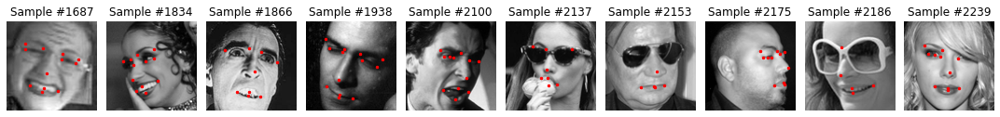


Examples of images missing left_eye_center_y


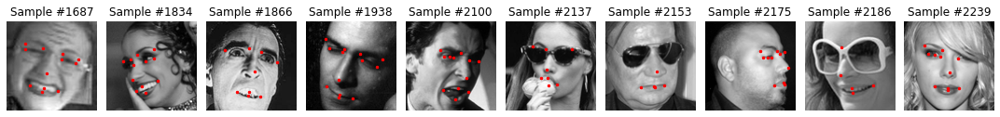


Examples of images missing right_eye_center_x


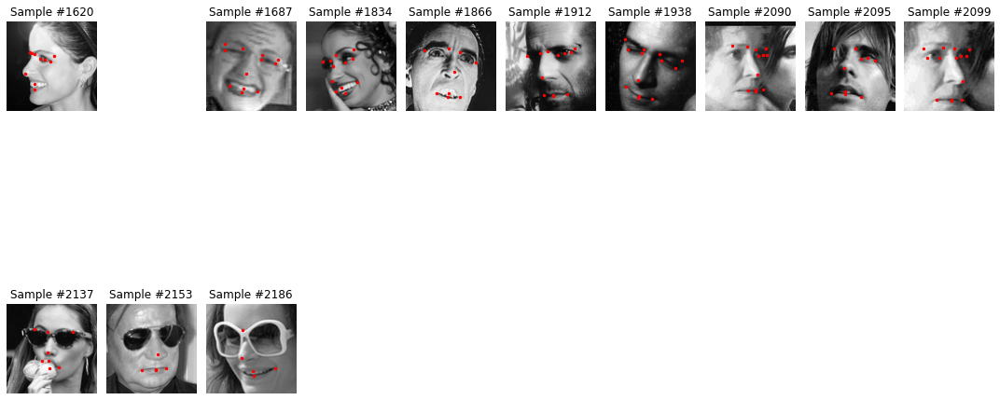


Examples of images missing right_eye_center_y


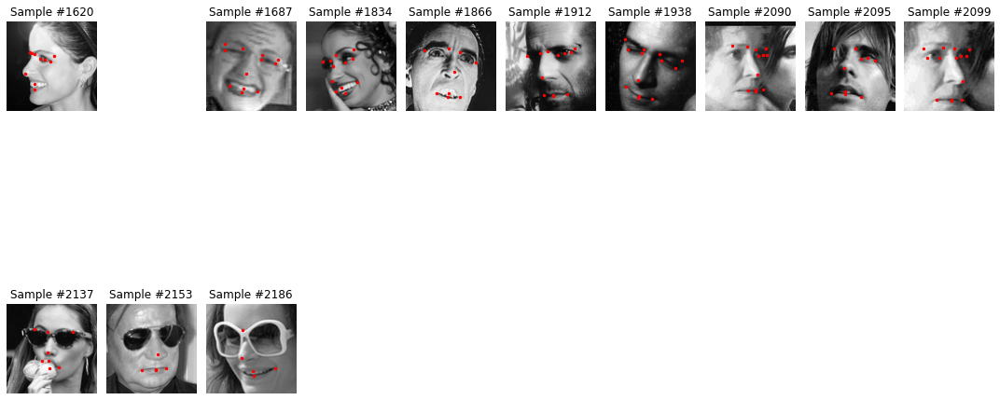


Examples of images missing left_eye_inner_corner_x


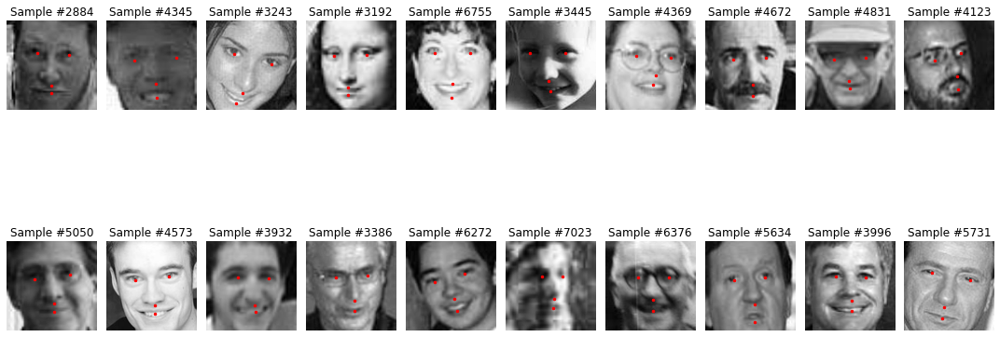


Examples of images missing left_eye_inner_corner_y


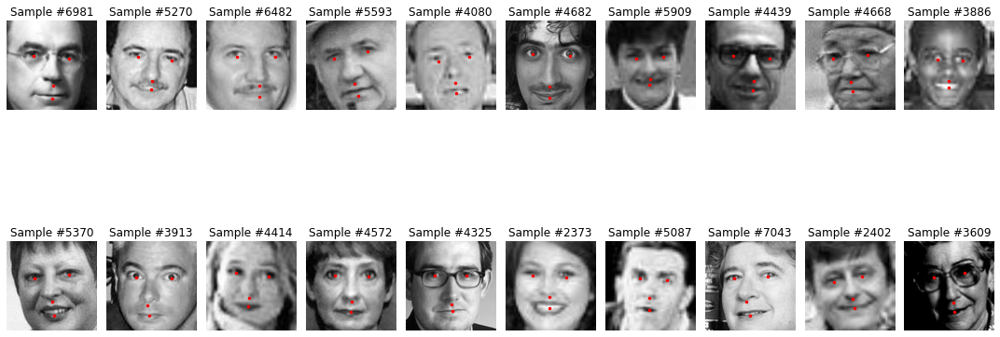


Examples of images missing left_eye_outer_corner_x


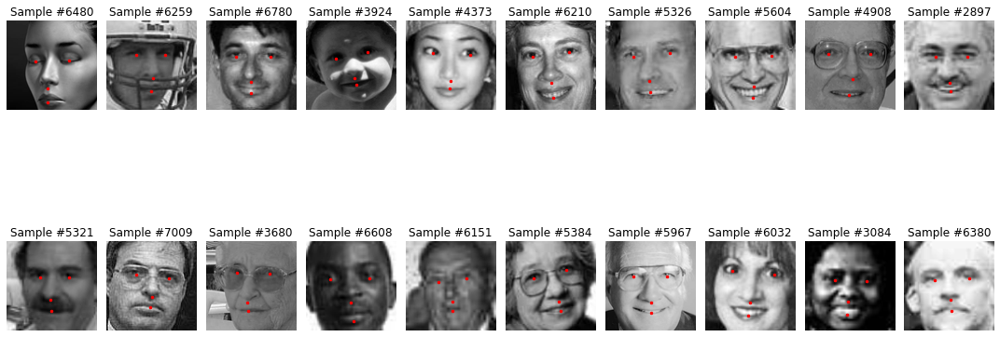


Examples of images missing left_eye_outer_corner_y


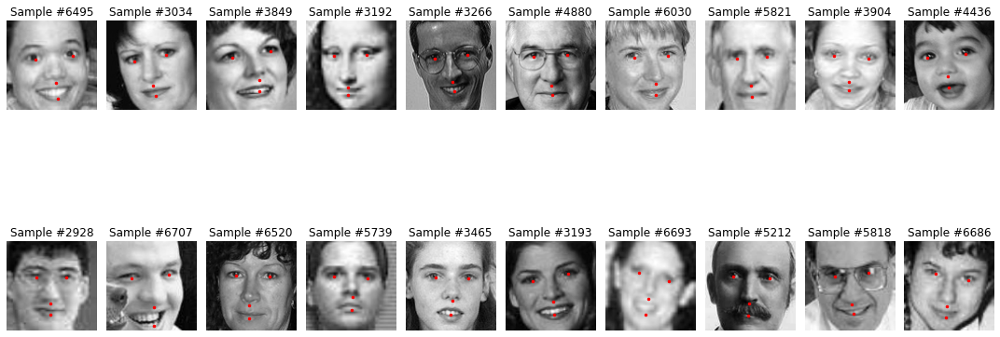


Examples of images missing right_eye_inner_corner_x


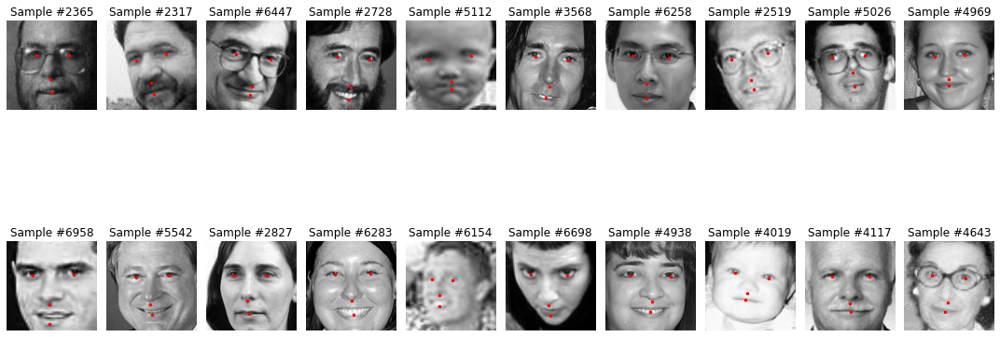


Examples of images missing right_eye_inner_corner_y


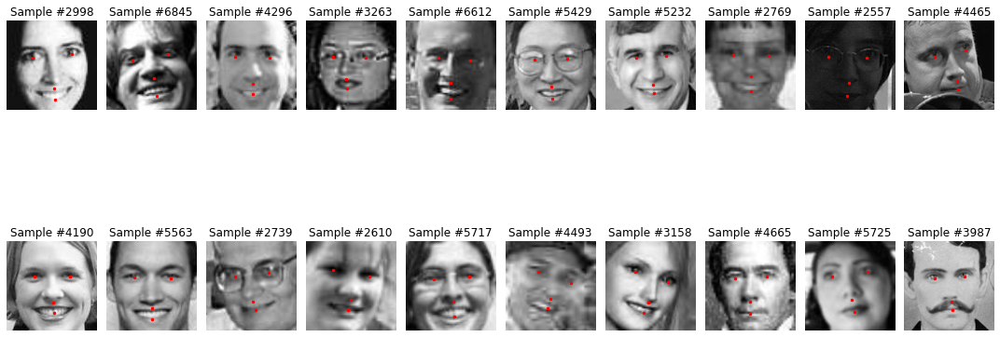


Examples of images missing right_eye_outer_corner_x


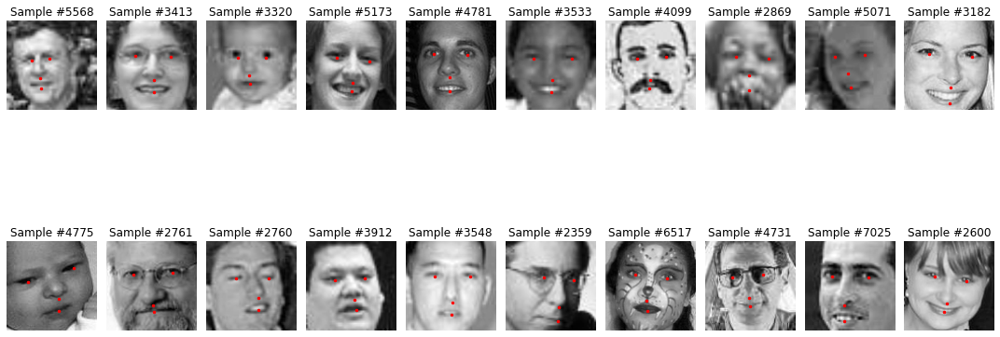


Examples of images missing right_eye_outer_corner_y


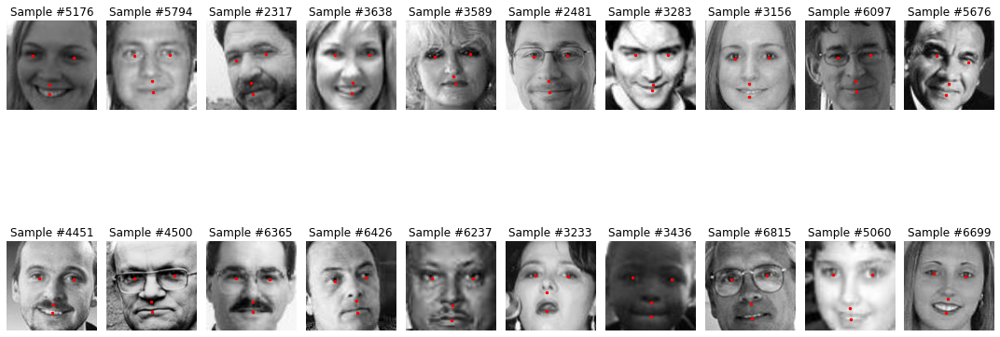


Examples of images missing left_eyebrow_inner_end_x


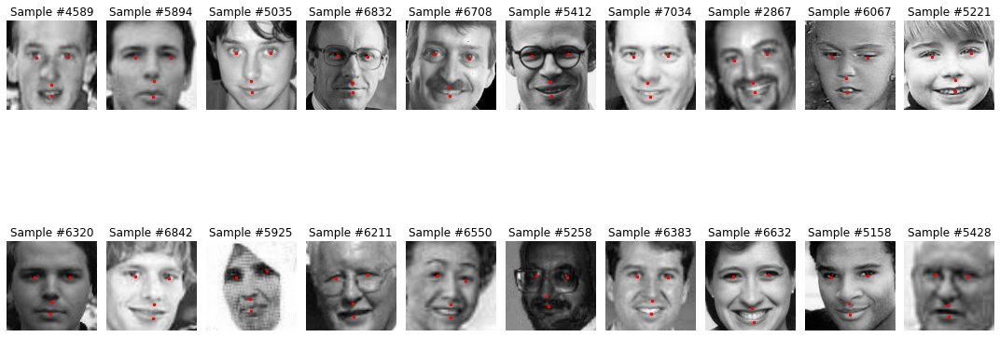


Examples of images missing left_eyebrow_inner_end_y


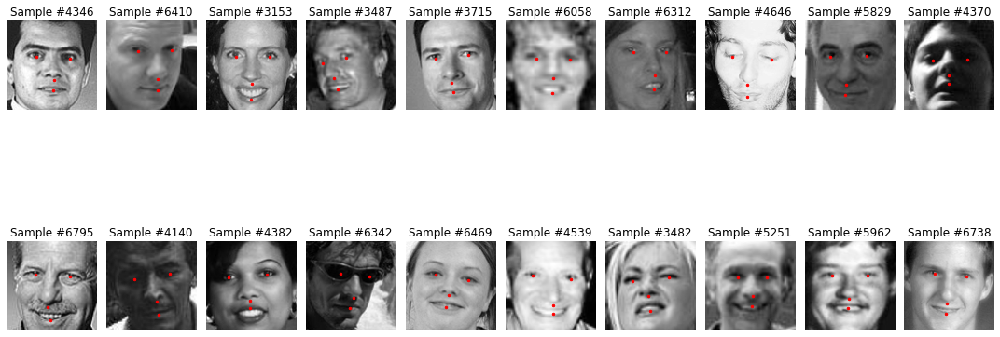


Examples of images missing left_eyebrow_outer_end_x


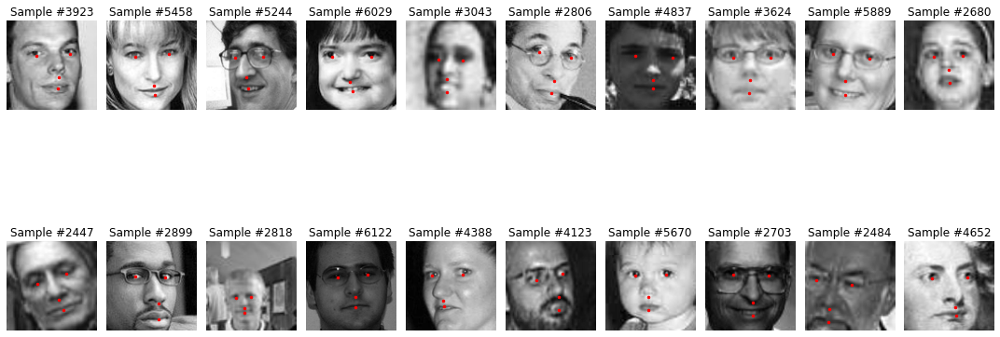


Examples of images missing left_eyebrow_outer_end_y


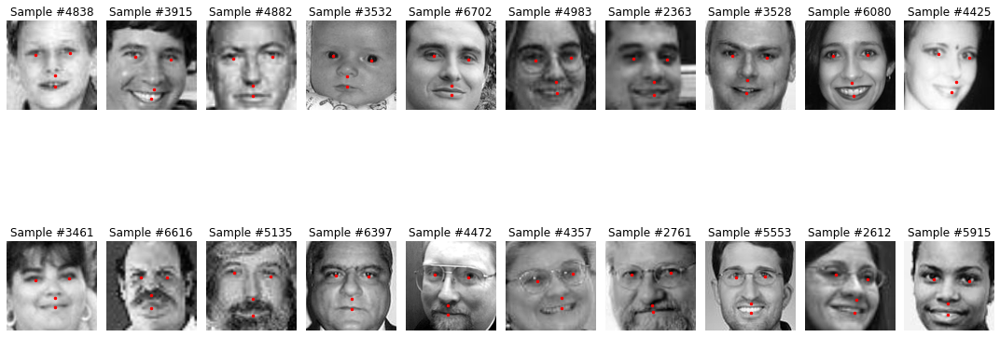


Examples of images missing right_eyebrow_inner_end_x


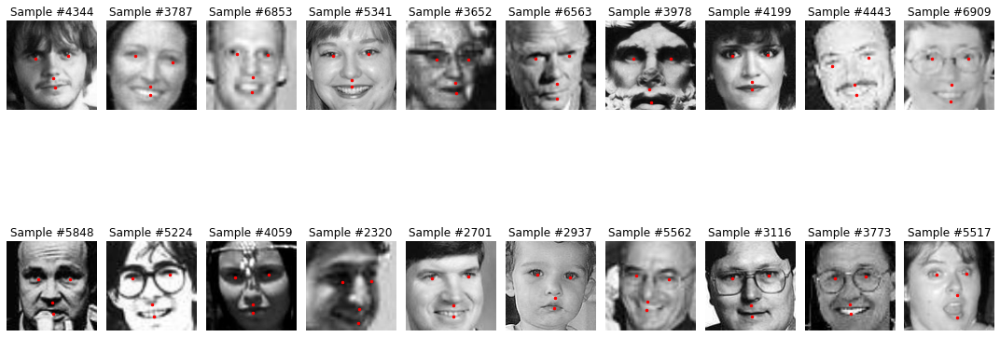


Examples of images missing right_eyebrow_inner_end_y


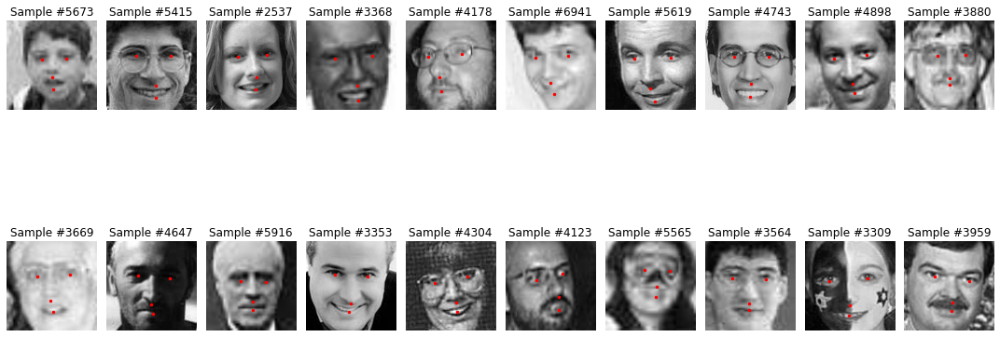


Examples of images missing right_eyebrow_outer_end_x


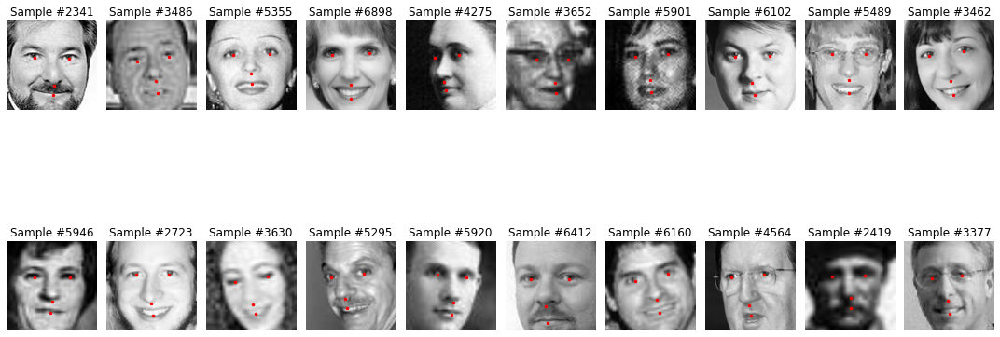


Examples of images missing right_eyebrow_outer_end_y


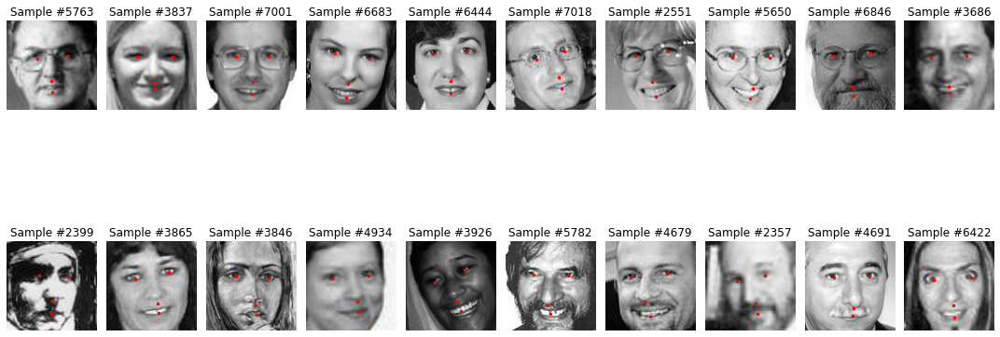


Examples of images missing mouth_left_corner_x


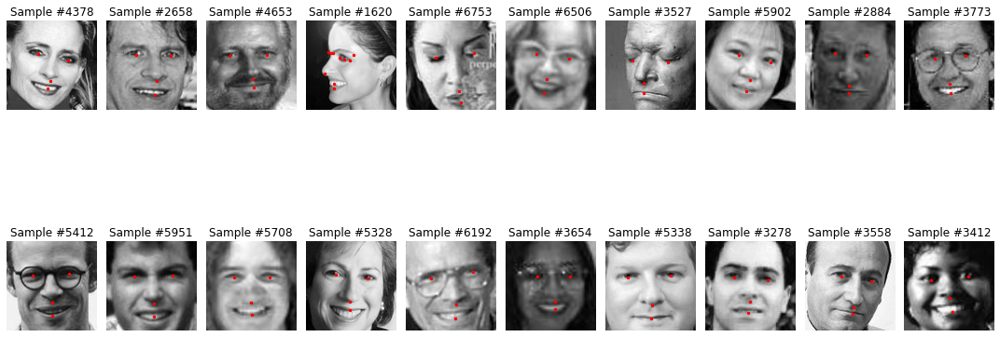


Examples of images missing mouth_left_corner_y


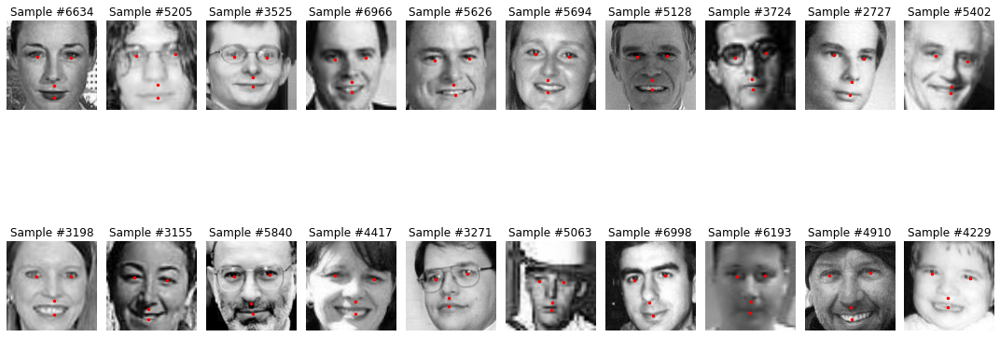


Examples of images missing mouth_right_corner_x


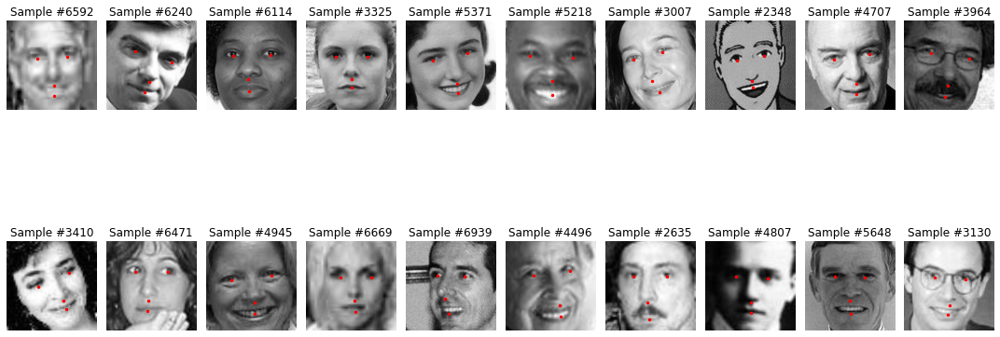


Examples of images missing mouth_right_corner_y


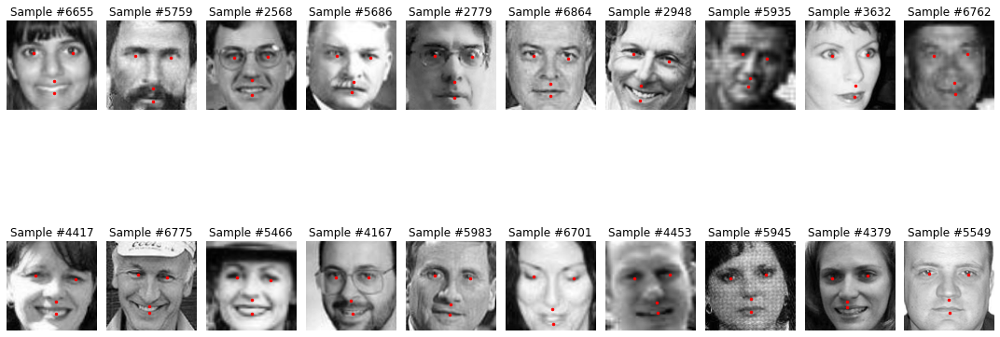


Examples of images missing mouth_center_top_lip_x


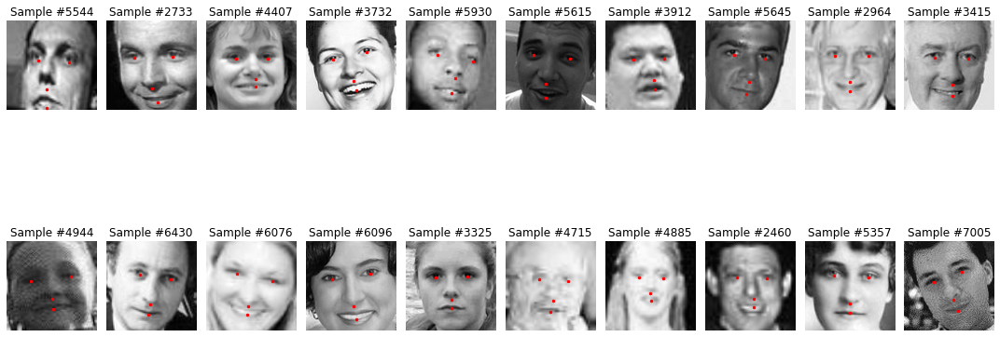


Examples of images missing mouth_center_top_lip_y


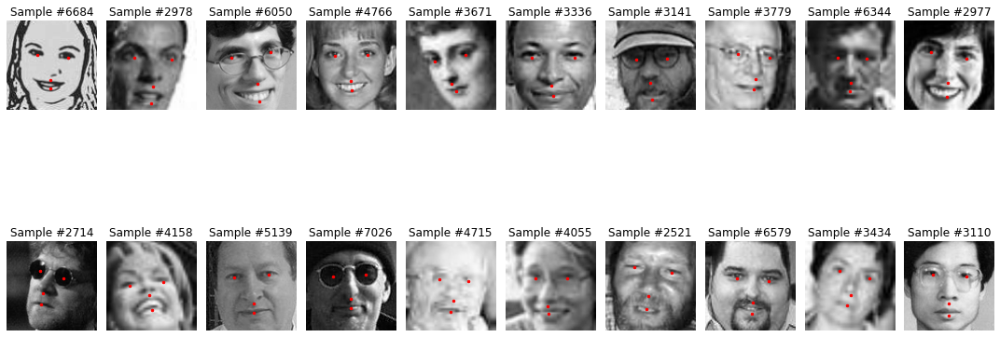


Examples of images missing mouth_center_bottom_lip_x


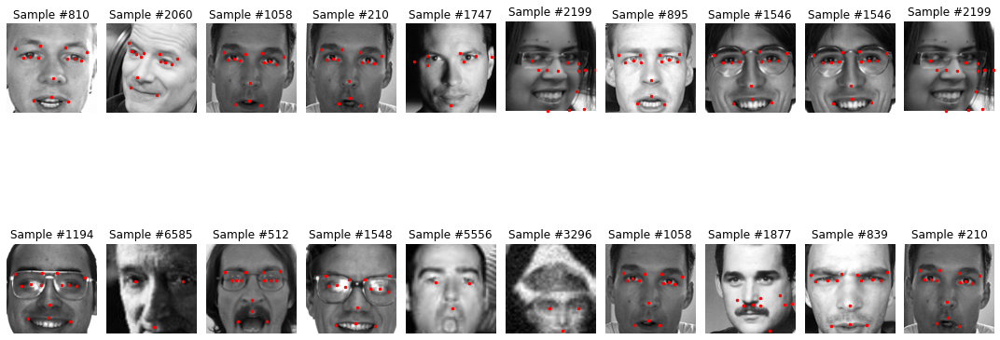


Examples of images missing mouth_center_bottom_lip_y


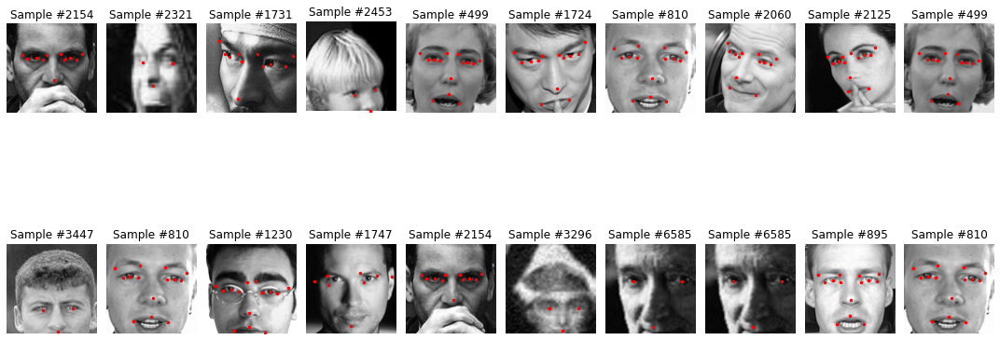

In [84]:
# show examples of up to 20 images with missing data for each column

column_labels = train_data.columns[:-1]

for i in range(len(column_labels)):
    if len(missing_data_indices[i]) == 0:
        continue
    elif len(missing_data_indices[i]) <= 20:
        print("\nExamples of images missing {}".format(column_labels[i]))
        show_images(train_data, missing_data_indices[i], ncols=10)
    else:
        print("\nExamples of images missing {}".format(column_labels[i]))
        rnd_ind = np.random.choice(missing_data_indices[i], 20)
        show_images(train_data, rnd_ind, ncols=10)